###Image Loading and Croppping

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

from skimage.metrics import mean_squared_error, peak_signal_noise_ratio

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.1 MB/s eta 0:00:00


In [ ]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

--2024-03-06 07:35:09--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 99.84.203.76, 99.84.203.111, 99.84.203.93, ...
Connecting to segment-anything.com (segment-anything.com)|99.84.203.76|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 216.61K  --.-KB/s    in 0.02s   

2024-03-06 07:35:09 (11.0 MB/s) - ‘dog.jpg’ saved [221810/221810]



In [ ]:
# Read in a image from torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


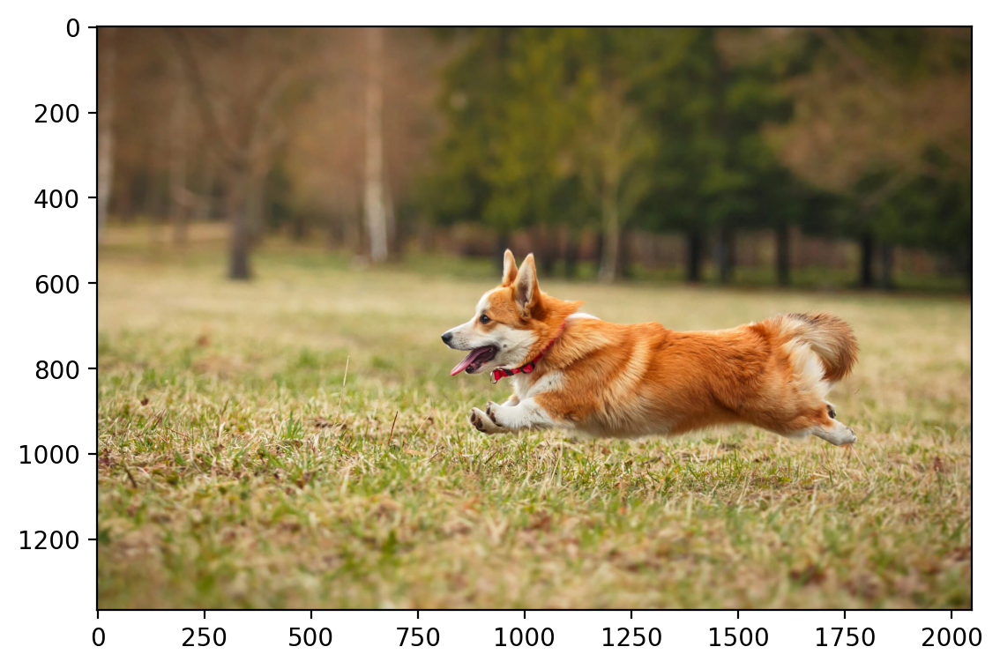

In [ ]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())


In [ ]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [ ]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

In [ ]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [ ]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

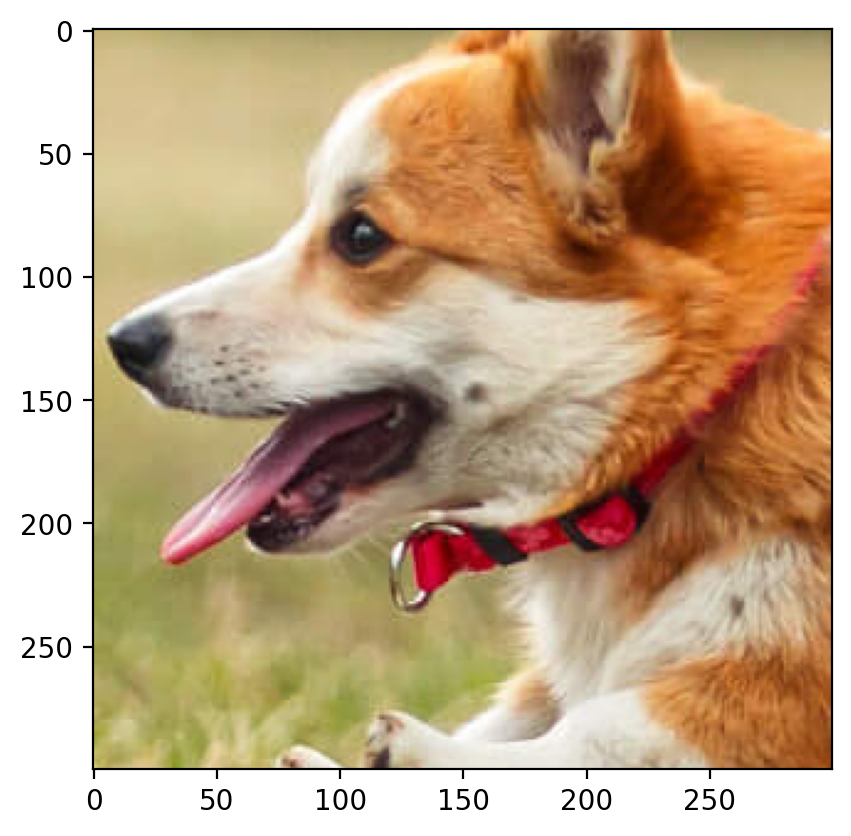

In [ ]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())


In [ ]:
crop = crop.to(device)
crop = torch.tensor(crop, dtype=torch.float32)

In [ ]:
# Get the dimensions of the image tensor
num_channels, height, width = crop.shape
print(num_channels, height, width)

3 300 300


###Functions Used

In [ ]:
import random

def add_n_random_nans(image, n):
    image = image.clone()
    # Convert image to tensor if it's not already
    if not torch.is_tensor(image):
        image = torch.tensor(image)

    # Get image dimensions
    num_channels, height, width = image.shape

    # Flatten image tensor
    flat_image = image.reshape(num_channels, -1)

    # Generate random indices for n pixels
    indices = random.sample(range(height * width), n)

    # Set values at selected indices to NaN for each channel
    for channel in range(num_channels):
        flat_image[channel][indices] = float('nan')

    # Reshape the flattened tensor to original shape
    image_with_nans = flat_image.reshape(num_channels, height, width)

    return image_with_nans, indices

In [ ]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [ ]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)


In [ ]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [ ]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=42)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)


In [ ]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()
    return outputs.cpu()

In [ ]:
psnri = []
rmsei = []

###Removal and prediction for 10%

In [ ]:
n = int(300 * 300 * 0.1)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[0.7686,    nan, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275,    nan, 0.5686]],

        [[0.6941,    nan, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294,    nan, 0.2588]],

        [[0.4745,    nan, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

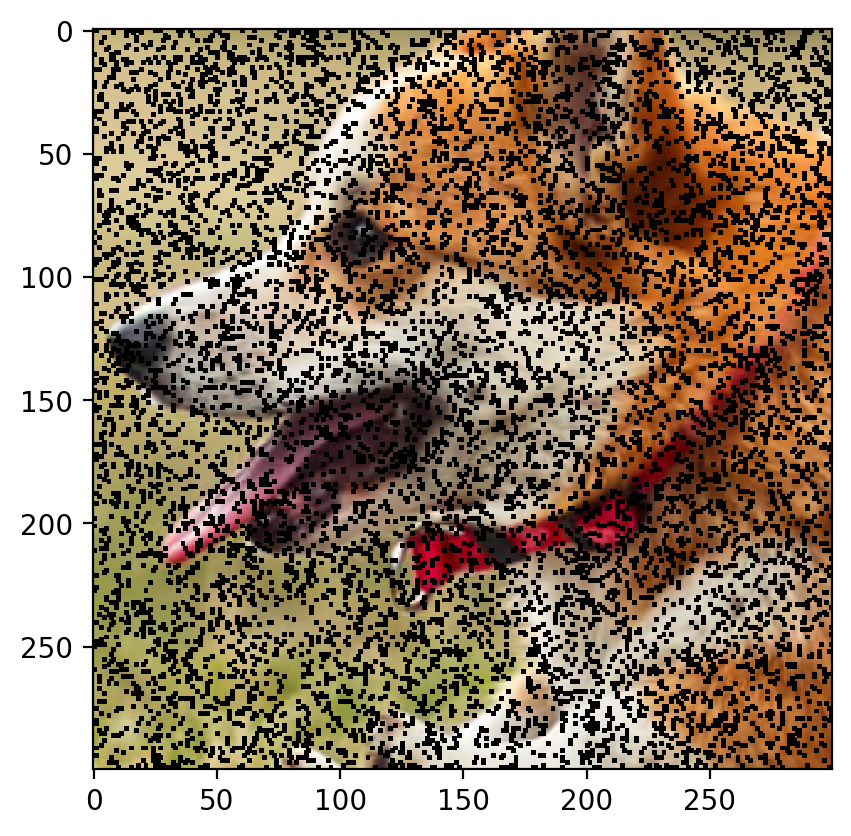

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 27000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.372628
Epoch 100 loss: 0.060433
Epoch 200 loss: 0.021020
Epoch 300 loss: 0.015284
Epoch 400 loss: 0.012695
Epoch 500 loss: 0.010932
Epoch 600 loss: 0.009630
Epoch 700 loss: 0.008629
Epoch 800 loss: 0.007839
Epoch 900 loss: 0.007206


0.0066973064094781876

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

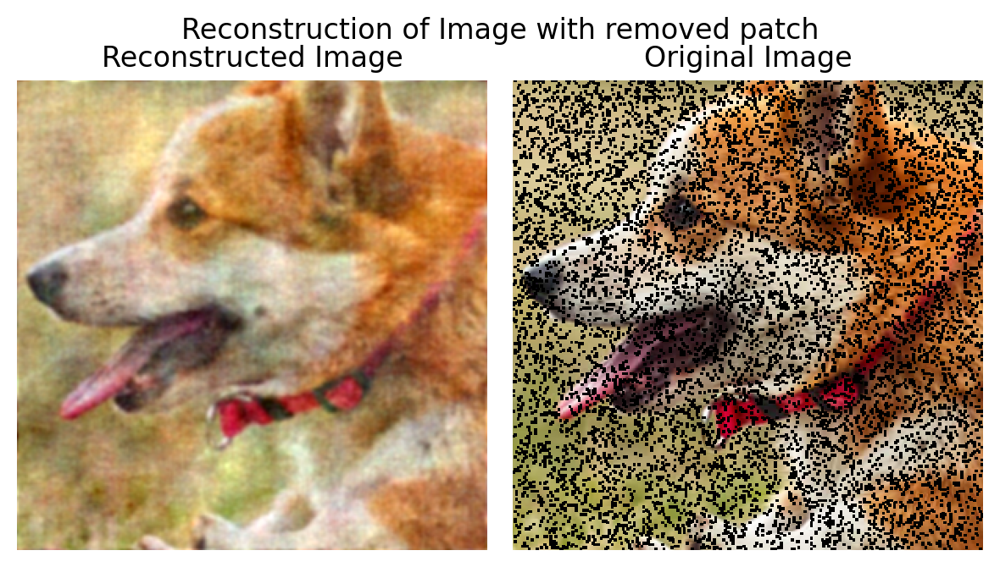

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 20%

In [ ]:
n = int(300 * 300 * 0.2)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[0.7686,    nan, 0.7686,  ..., 0.5451, 0.5451,    nan],
         [0.7725, 0.7725, 0.7725,  ...,    nan, 0.5686,    nan],
         [   nan,    nan, 0.7765,  ...,    nan, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ...,    nan, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [   nan, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941,    nan, 0.6941,  ..., 0.5137, 0.5137,    nan],
         [0.6980, 0.6980, 0.6980,  ...,    nan, 0.5255,    nan],
         [   nan,    nan, 0.7020,  ...,    nan, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ...,    nan, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [   nan, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745,    nan, 0.4745,  ..., 0.3294, 0.3294,    nan],
         [0.4784, 0.4784, 0.4784,  ...,    nan, 0.3451,    nan],
         [   nan,    nan, 0.4824,  ...,    nan, 0.3608, 0.

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

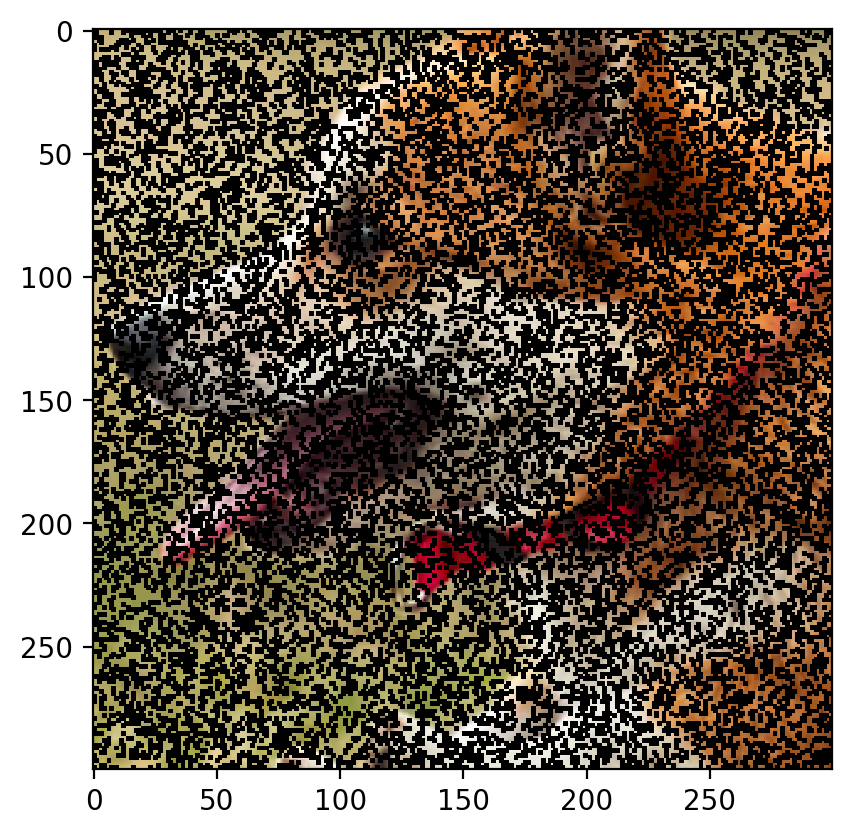

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 54000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.374703
Epoch 100 loss: 0.060158
Epoch 200 loss: 0.020742
Epoch 300 loss: 0.015011
Epoch 400 loss: 0.012477
Epoch 500 loss: 0.010759
Epoch 600 loss: 0.009488
Epoch 700 loss: 0.008510
Epoch 800 loss: 0.007739
Epoch 900 loss: 0.007121


0.006623945198953152

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

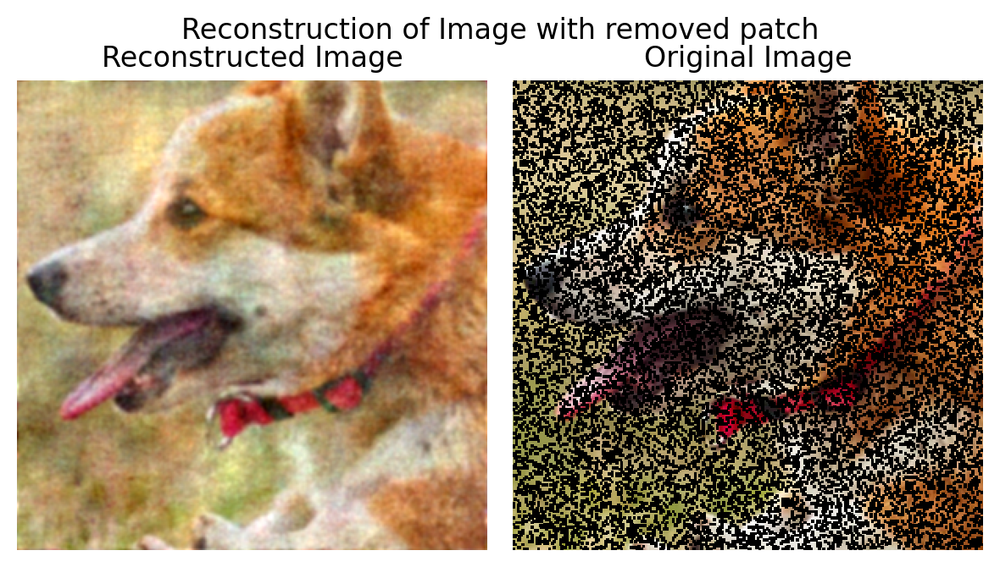

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 30%

In [ ]:
n = int(300 * 300 * 0.3)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451,    nan],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686,    nan,    nan],
         [   nan, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [   nan,    nan,    nan,  ..., 0.5843,    nan, 0.5490],
         [0.8471, 0.7843,    nan,  ..., 0.6039, 0.5686,    nan],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137,    nan],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255,    nan,    nan],
         [   nan, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [   nan,    nan,    nan,  ..., 0.2824,    nan, 0.2431],
         [0.8157, 0.7569,    nan,  ..., 0.3059, 0.2667,    nan],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294,    nan],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451,    nan,    nan],
         [   nan, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

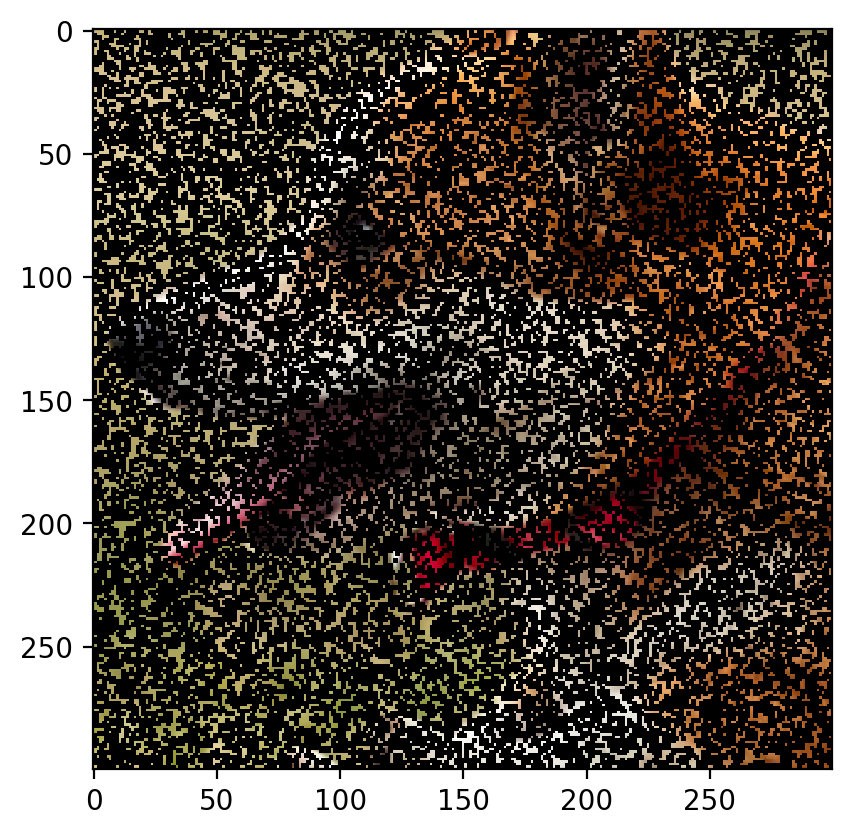

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 81000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.372518
Epoch 100 loss: 0.059519
Epoch 200 loss: 0.020665
Epoch 300 loss: 0.014822
Epoch 400 loss: 0.012293
Epoch 500 loss: 0.010583
Epoch 600 loss: 0.009319
Epoch 700 loss: 0.008347
Epoch 800 loss: 0.007583
Epoch 900 loss: 0.006971


0.006481288466602564

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

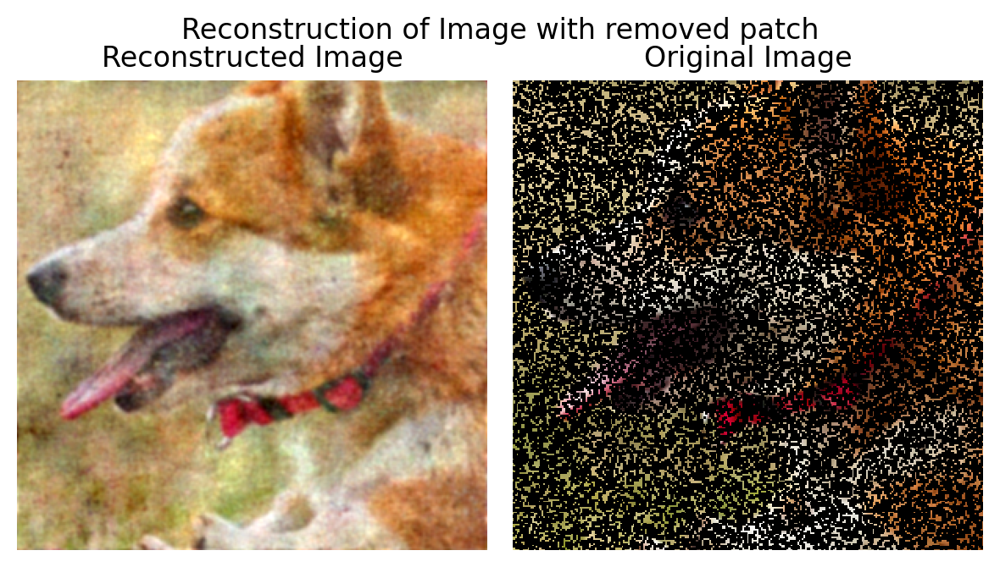

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 40%

In [ ]:
n = int(300 * 300 * 0.4)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[   nan,    nan,    nan,  ...,    nan, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686,    nan, 0.5647],
         [0.7765, 0.7765, 0.7765,  ...,    nan, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [   nan,    nan, 0.7451,  ...,    nan,    nan, 0.5569],
         [0.8784,    nan,    nan,  ...,    nan, 0.5804, 0.5686]],

        [[   nan,    nan,    nan,  ...,    nan, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255,    nan, 0.5216],
         [0.7020, 0.7020, 0.7020,  ...,    nan, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [   nan,    nan, 0.7137,  ...,    nan,    nan, 0.2431],
         [0.8431,    nan,    nan,  ...,    nan, 0.2706, 0.2588]],

        [[   nan,    nan,    nan,  ...,    nan, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451,    nan, 0.3412],
         [0.4824, 0.4824, 0.4824,  ...,    nan, 0.3608, 0.

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

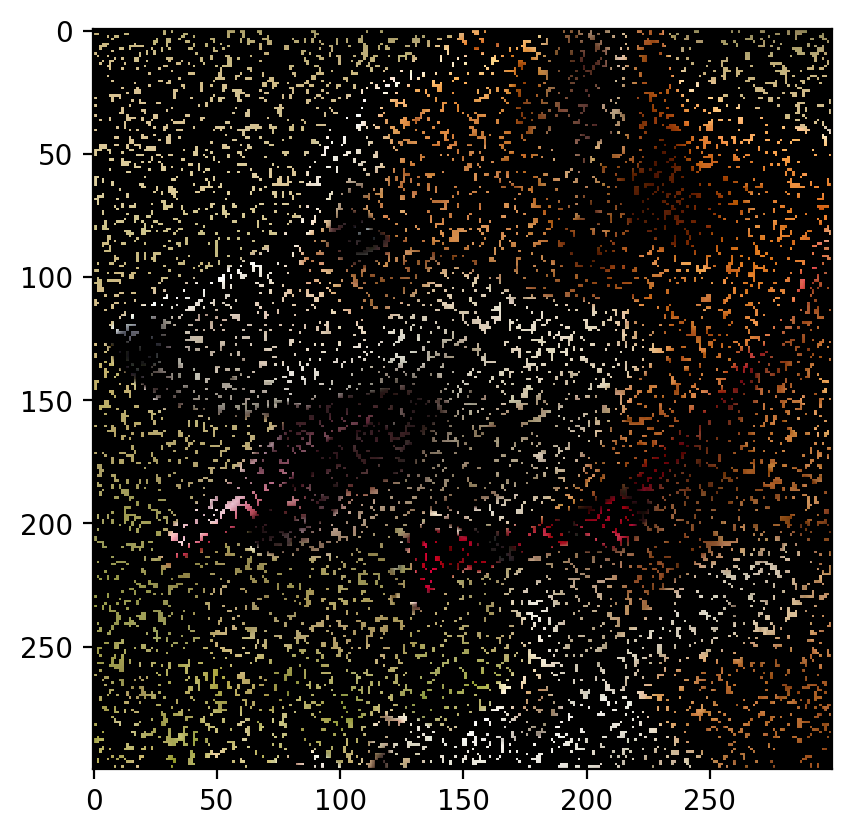

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 108000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.368556
Epoch 100 loss: 0.057376
Epoch 200 loss: 0.020290
Epoch 300 loss: 0.014510
Epoch 400 loss: 0.011991
Epoch 500 loss: 0.010301
Epoch 600 loss: 0.009059
Epoch 700 loss: 0.008106
Epoch 800 loss: 0.007357
Epoch 900 loss: 0.006757


0.006275828927755356

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

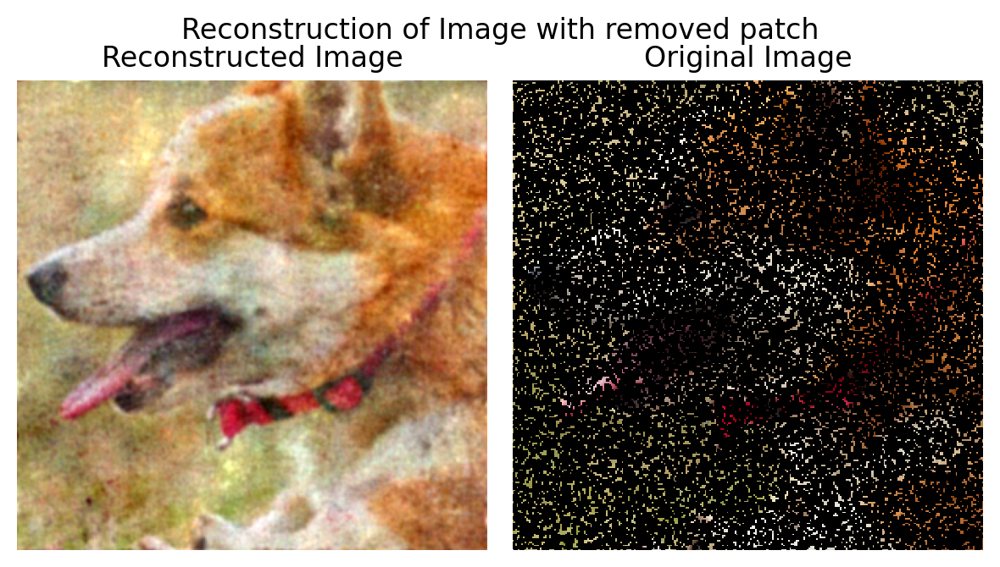

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 50%

In [ ]:
n = int(300 * 300 * 0.5)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[   nan,    nan, 0.7686,  ...,    nan,    nan,    nan],
         [   nan, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [   nan,    nan, 0.7765,  ..., 0.5882, 0.5843,    nan],
         ...,
         [0.7961,    nan,    nan,  ..., 0.5843, 0.5725,    nan],
         [   nan,    nan,    nan,  ..., 0.6039,    nan,    nan],
         [0.8784,    nan, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[   nan,    nan, 0.6941,  ...,    nan,    nan,    nan],
         [   nan, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [   nan,    nan, 0.7020,  ..., 0.5451, 0.5412,    nan],
         ...,
         [0.7686,    nan,    nan,  ..., 0.2824, 0.2706,    nan],
         [   nan,    nan,    nan,  ..., 0.3059,    nan,    nan],
         [0.8431,    nan, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[   nan,    nan, 0.4745,  ...,    nan,    nan,    nan],
         [   nan, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [   nan,    nan, 0.4824,  ..., 0.3647, 0.3608,   

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

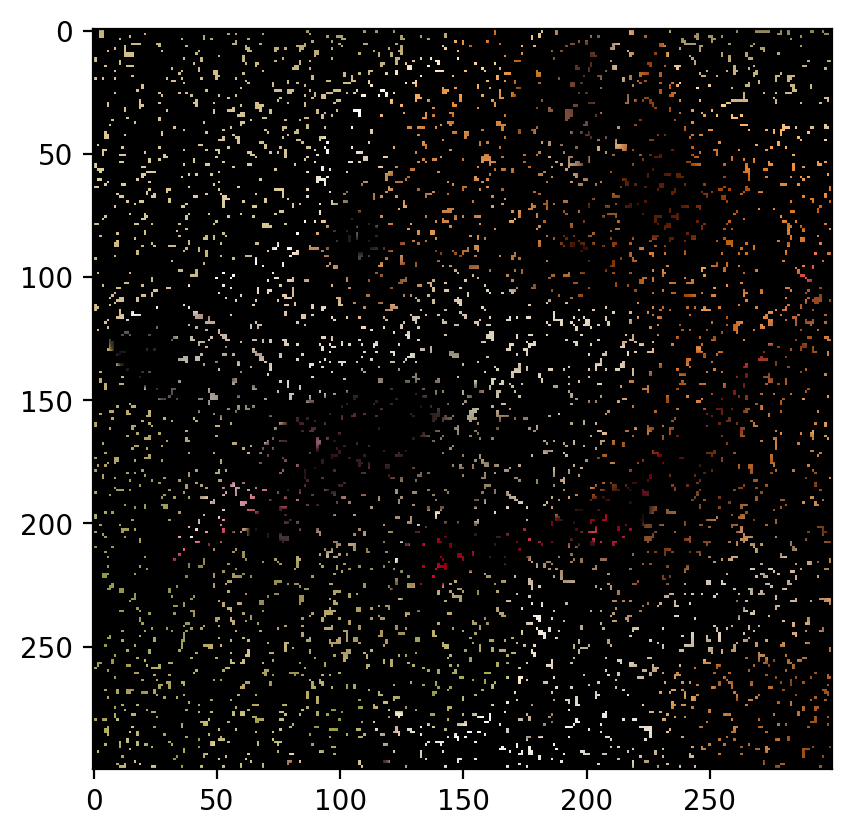

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 135000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.376112
Epoch 100 loss: 0.058024
Epoch 200 loss: 0.020147
Epoch 300 loss: 0.014112
Epoch 400 loss: 0.011640
Epoch 500 loss: 0.010009
Epoch 600 loss: 0.008809
Epoch 700 loss: 0.007886
Epoch 800 loss: 0.007160
Epoch 900 loss: 0.006578


0.006111284717917442

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

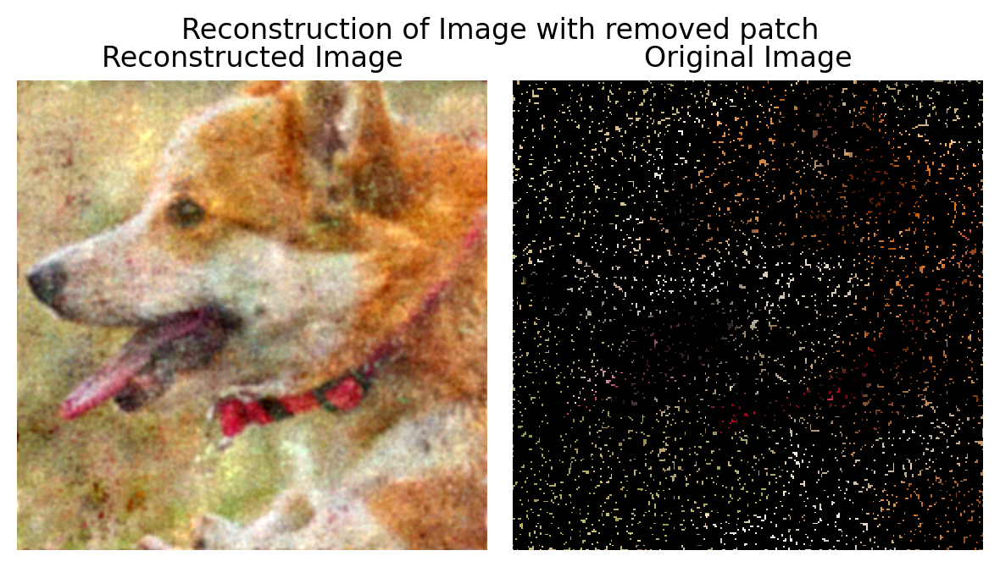

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 60%

In [ ]:
n = int(300 * 300 * 0.6)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[   nan, 0.7686, 0.7686,  ..., 0.5451,    nan, 0.5412],
         [   nan, 0.7725,    nan,  ...,    nan,    nan,    nan],
         [   nan, 0.7765,    nan,  ...,    nan, 0.5843,    nan],
         ...,
         [   nan,    nan,    nan,  ..., 0.5843,    nan, 0.5490],
         [0.8471, 0.7843,    nan,  ..., 0.6039,    nan,    nan],
         [   nan, 0.8196, 0.7686,  ..., 0.6275,    nan, 0.5686]],

        [[   nan, 0.6941, 0.6941,  ..., 0.5137,    nan, 0.5098],
         [   nan, 0.6980,    nan,  ...,    nan,    nan,    nan],
         [   nan, 0.7020,    nan,  ...,    nan, 0.5412,    nan],
         ...,
         [   nan,    nan,    nan,  ..., 0.2824,    nan, 0.2431],
         [0.8157, 0.7569,    nan,  ..., 0.3059,    nan,    nan],
         [   nan, 0.7882, 0.7333,  ..., 0.3294,    nan, 0.2588]],

        [[   nan, 0.4745, 0.4745,  ..., 0.3294,    nan, 0.3255],
         [   nan, 0.4784,    nan,  ...,    nan,    nan,    nan],
         [   nan, 0.4824,    nan,  ...,    nan, 0.3608,   

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

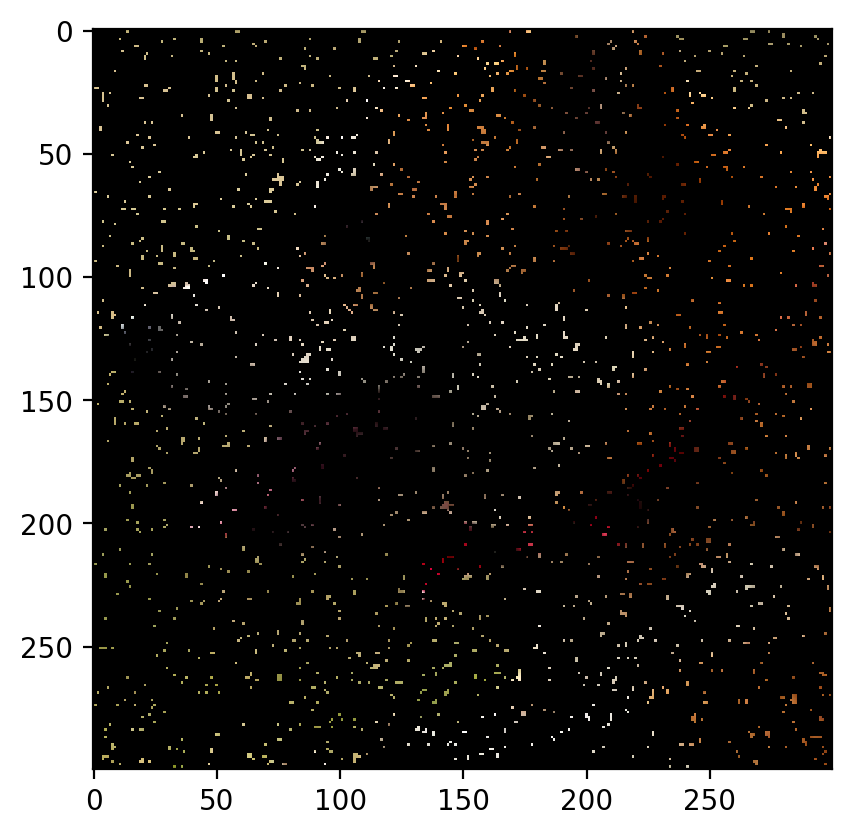

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 162000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.373495
Epoch 100 loss: 0.055304
Epoch 200 loss: 0.019700
Epoch 300 loss: 0.013463
Epoch 400 loss: 0.011010
Epoch 500 loss: 0.009462
Epoch 600 loss: 0.008334
Epoch 700 loss: 0.007468
Epoch 800 loss: 0.006783
Epoch 900 loss: 0.006232


0.0057863397523760796

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

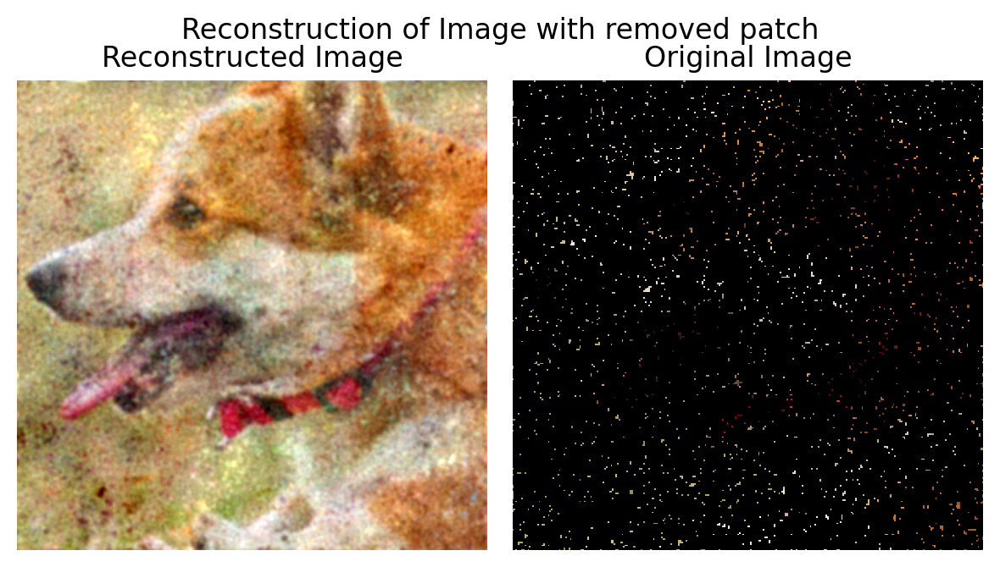

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 70%

In [ ]:
n = int(300 * 300 * 0.7)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[   nan, 0.7686, 0.7686,  ..., 0.5451,    nan, 0.5412],
         [0.7725,    nan,    nan,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765,    nan,  ...,    nan, 0.5843,    nan],
         ...,
         [   nan,    nan,    nan,  ...,    nan, 0.5725, 0.5490],
         [   nan, 0.7843,    nan,  ...,    nan, 0.5686,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan]],

        [[   nan, 0.6941, 0.6941,  ..., 0.5137,    nan, 0.5098],
         [0.6980,    nan,    nan,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020,    nan,  ...,    nan, 0.5412,    nan],
         ...,
         [   nan,    nan,    nan,  ...,    nan, 0.2706, 0.2431],
         [   nan, 0.7569,    nan,  ...,    nan, 0.2667,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan]],

        [[   nan, 0.4745, 0.4745,  ..., 0.3294,    nan, 0.3255],
         [0.4784,    nan,    nan,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824,    nan,  ...,    nan, 0.3608,   

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

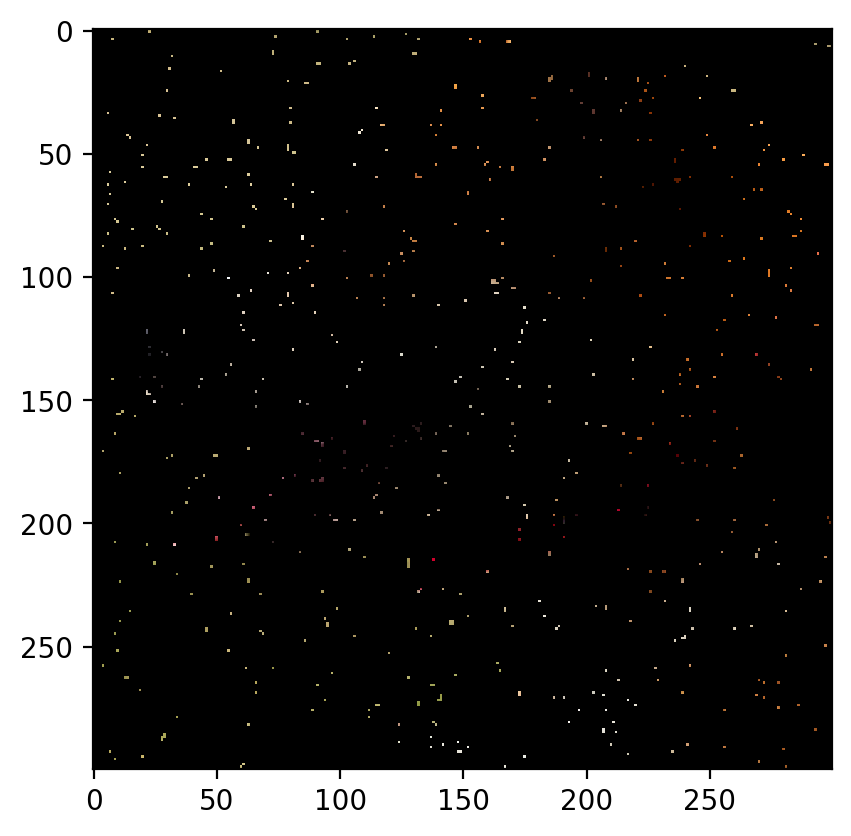

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 188997


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.370555
Epoch 100 loss: 0.051632
Epoch 200 loss: 0.018952
Epoch 300 loss: 0.012600
Epoch 400 loss: 0.010121
Epoch 500 loss: 0.008648
Epoch 600 loss: 0.007606
Epoch 700 loss: 0.006811
Epoch 800 loss: 0.006182
Epoch 900 loss: 0.005675


0.005262664519250393

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

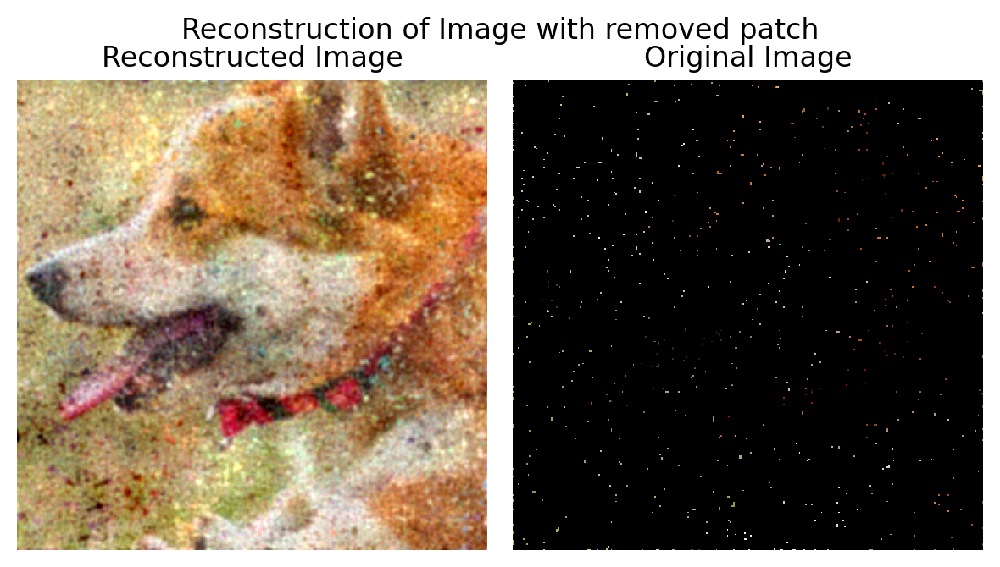

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 80%

In [ ]:
n = int(300 * 300 * 0.8)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[0.7686,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan, 0.7725,  ...,    nan,    nan, 0.5647],
         [   nan,    nan, 0.7765,  ..., 0.5882,    nan,    nan],
         ...,
         [   nan, 0.7373,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan,    nan,  ...,    nan, 0.5686,    nan],
         [   nan, 0.8196,    nan,  ...,    nan,    nan,    nan]],

        [[0.6941,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan, 0.6980,  ...,    nan,    nan, 0.5216],
         [   nan,    nan, 0.7020,  ..., 0.5451,    nan,    nan],
         ...,
         [   nan, 0.7098,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan,    nan,  ...,    nan, 0.2667,    nan],
         [   nan, 0.7882,    nan,  ...,    nan,    nan,    nan]],

        [[0.4745,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan, 0.4784,  ...,    nan,    nan, 0.3412],
         [   nan,    nan, 0.4824,  ..., 0.3647,    nan,   

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

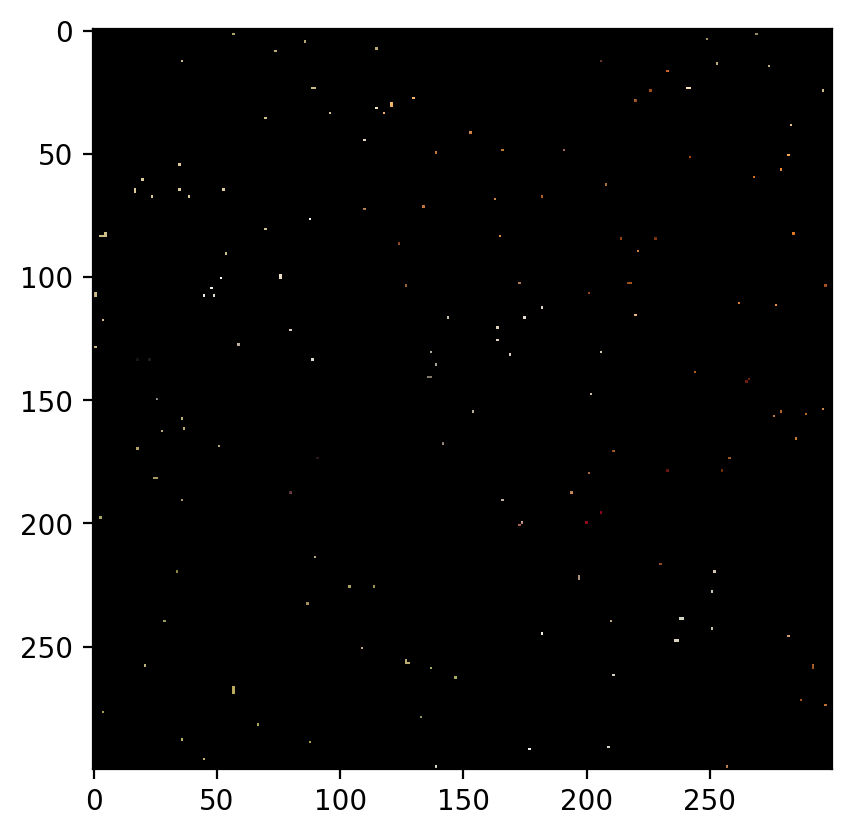

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 216000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.371719
Epoch 100 loss: 0.043884
Epoch 200 loss: 0.016330
Epoch 300 loss: 0.010522
Epoch 400 loss: 0.008133
Epoch 500 loss: 0.006778
Epoch 600 loss: 0.005873
Epoch 700 loss: 0.005208
Epoch 800 loss: 0.004693
Epoch 900 loss: 0.004280


0.003944681491702795

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

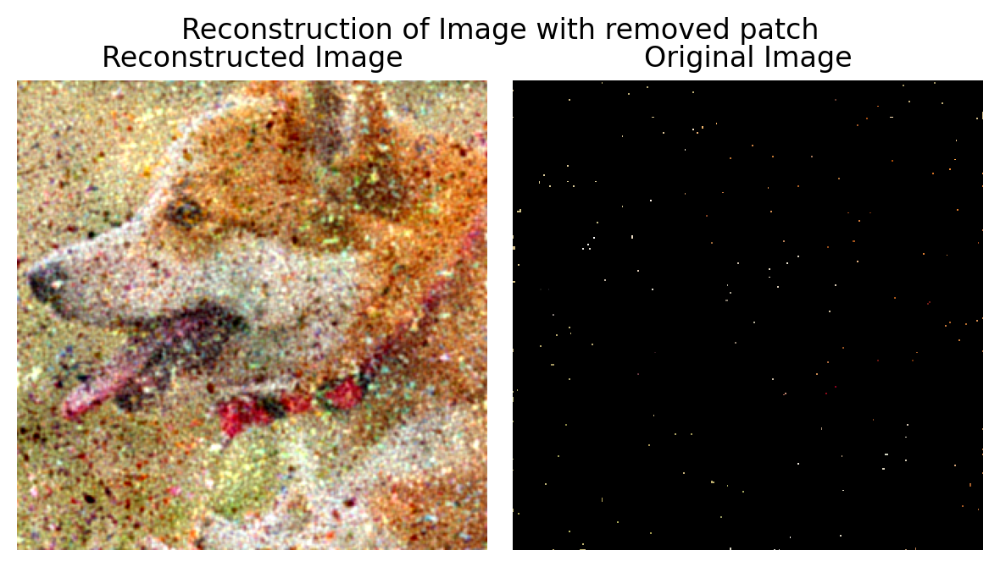

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Removal and prediction for 90%



In [ ]:
n = int(300 * 300 * 0.9)  # Number of random pixels to change to NaN

image_with_nans, indices = add_n_random_nans(crop, n)

In [ ]:
image_with_nans

tensor([[[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan,    nan,  ...,    nan, 0.5686,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         ...,
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan, 0.7451,  ...,    nan, 0.5686,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan]],

        [[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan,    nan,  ...,    nan, 0.5255,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         ...,
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan, 0.7137,  ...,    nan, 0.2667,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,    nan]],

        [[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
         [   nan,    nan,    nan,  ...,    nan, 0.3451,    nan],
         [   nan,    nan,    nan,  ...,    nan,    nan,   

In [ ]:
image_with_nans.shape

torch.Size([3, 300, 300])

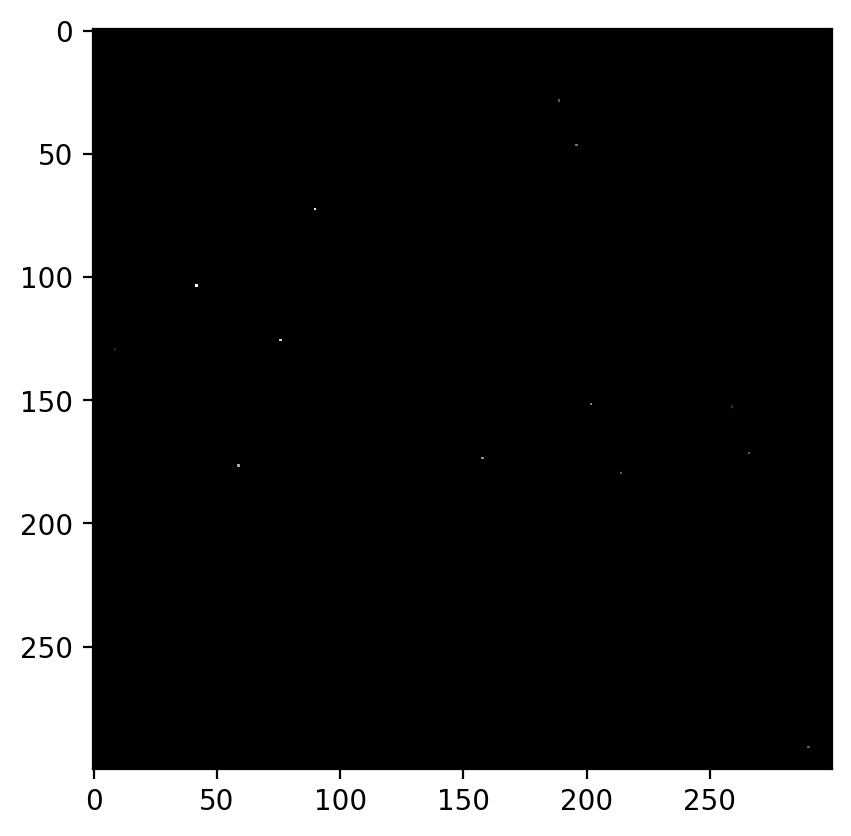

In [ ]:
plt.imshow(rearrange(image_with_nans, 'c h w -> h w c').cpu().numpy())

In [ ]:
dog_X,dog_Y=create_coordinate_map(image_with_nans)

nan_count = torch.isnan(dog_Y).sum().item()

# Print the result
print("Number of NaN values:", nan_count)

dog_Xnew = np.delete(dog_X.cpu(),indices,axis=0)
dog_Ynew = np.delete(dog_Y.cpu(),indices,axis=0)

scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_Xnew.cpu())
# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_Xnew.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()
# dog_X, dog_X_scaled

Number of NaN values: 243000


In [ ]:
dog_Ynew = dog_Ynew.to(device)

In [ ]:
nan_count = torch.isnan(dog_Ynew).sum().item()

# Print the result
print("Number of NaN values:", nan_count)


Number of NaN values: 0


In [ ]:
X_rff = create_rff_features(dog_X_scaled, 10000, 0.008)
X_rff = X_rff.to(device)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, dog_Ynew, 1000)

Epoch 0 loss: 0.366766
Epoch 100 loss: 0.025723
Epoch 200 loss: 0.007651
Epoch 300 loss: 0.004108
Epoch 400 loss: 0.002656
Epoch 500 loss: 0.001878
Epoch 600 loss: 0.001404
Epoch 700 loss: 0.001090
Epoch 800 loss: 0.000871
Epoch 900 loss: 0.000712


0.0005938655813224614

In [ ]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaledp = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaledp = torch.tensor(dog_X_scaledp).to(device)

# Set to dtype float32
dog_X_scaledp = dog_X_scaledp.float()

In [ ]:
X_rffp = create_rff_features(dog_X_scaledp, 10000, 0.008)

In [ ]:
X_rffp.shape

torch.Size([90000, 10000])

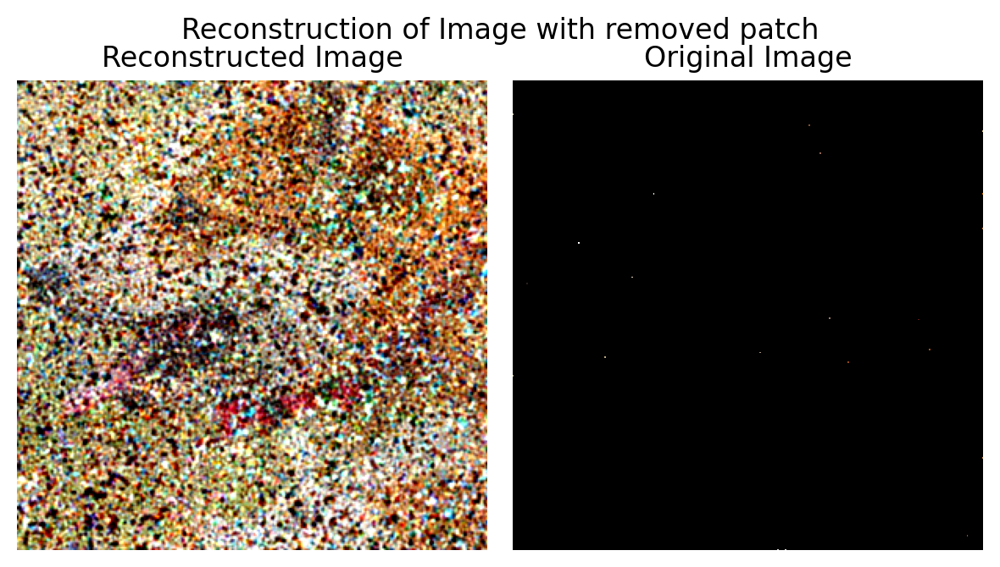

In [ ]:
pred_img = plot_reconstructed_and_original_image(image_with_nans, net, X_rffp, title="Reconstruction of Image with removed patch")

In [ ]:
rmsei.append(np.sqrt(mean_squared_error(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy())))
psnri.append(peak_signal_noise_ratio(rearrange(crop, 'c h w -> h w c').cpu().numpy(), pred_img.numpy()))

###Plot of Rmse and psnr values

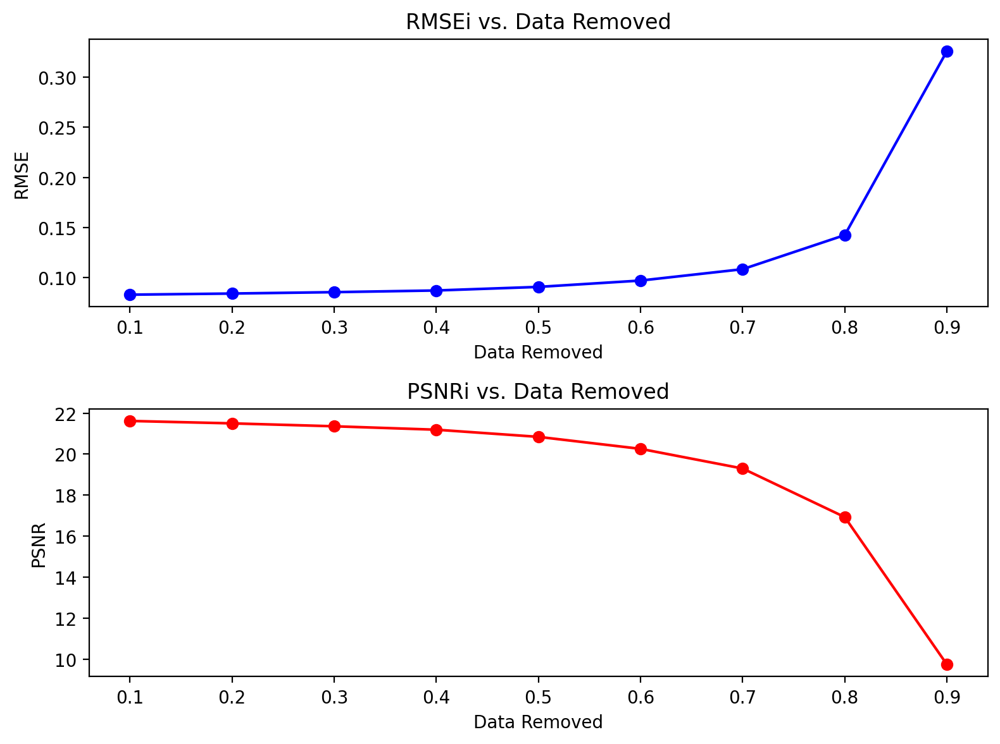

In [ ]:
import matplotlib.pyplot as plt

# Sample data
data_removed = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Create a figure and subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6))

# Plot rmsei
ax1.plot(data_removed, rmsei, marker = "o",  color='b')
ax1.set_title('RMSEi vs. Data Removed')
ax1.set_xlabel('Data Removed')
ax1.set_ylabel('RMSE')

# Plot psnri
ax2.plot(data_removed, psnri, marker = "o",  color='r')
ax2.set_title('PSNRi vs. Data Removed')
ax2.set_xlabel('Data Removed')
ax2.set_ylabel('PSNR')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


In [ ]:
print(rmsei)
print(psnri)

[0.08301501691962006, 0.08415519236909356, 0.08553609203705942, 0.0872003926638375, 0.09076901949871578, 0.09708959394514234, 0.1084277348517107, 0.14242524942849383, 0.32580991600012016]
[21.616866784908293, 21.49838165848645, 21.35701191242607, 21.189631188652804, 20.841247116936824, 20.256546304905424, 19.297192298312588, 16.92826022586537, 9.740714042133945]


###Clear Gpu cache

In [ ]:
torch.cuda.empty_cache()

###Observations

We utilized Random Fourier Features (RFF) with 10,000 features for image reconstruction. Unfortunately, due to hardware constraints, we were unable to work with a higher number of features. However, we anticipate that increasing the number of features would lead to improved results. Our experimentation with 8,000 and 10,000 RFF features showed enhanced prediction accuracy and reduced blurriness in the results.

The following are the results obtained:

Even when 90% of the data is removed from the original image, the image becomes unrecognizable to the human eye. However, through our reconstruction process, we were able to achieve decent results where the dog in the image is clearly visible. This outcome is truly remarkable.

We have calculated the Root Mean Square Error (RMSE) between the predicted and ground truth high-resolution images, as well as the Peak Signal-to-Noise Ratio (PSNR) values. Our findings indicate that as more data is removed, the RMSE value increases while the PSNR value decreases. This trend is visually represented in the accompanying graph.

###RMSE vs. Data Removed (Top Graph):

The y-axis is labeled "RMSE," which stands for Root Mean Square Error, a measure of the differences between values predicted by a model and the values actually observed.
The RMSE values remain relatively stable and low from 0.1 to about 0.5 data removed, suggesting that the model's performance is consistent despite the removal of up to 50% of the data.
However, there is a noticeable increase in RMSE from 0.6 to 0.9 data removed, with a sharp rise between 0.8 and 0.9. This indicates that the model's prediction error increases significantly when more than 60% of the data is removed, with the greatest loss in accuracy occurring after 80% of the data is removed.

###PSNR vs. Data Removed (Bottom Graph):

The y-axis is labeled "PSNR," which stands for Peak Signal-to-Noise Ratio, a measure used to assess the quality of reconstruction of lossy compression codecs.
The PSNR values start high when only 10% of the data is removed and gradually decrease as more data is removed.
The decrease in PSNR is relatively slow and linear from 0.1 to about 0.5 data removed, but it becomes more pronounced from 0.6 onwards, with a steep decline between 0.8 and 0.9 data removed. This suggests that the quality of the reconstruction degrades significantly when more than 60% of the data is removed, with the most substantial degradation occurring after 80% of the data is removed.

###Inferences:

Both RMSE and PSNR metrics indicate that the system or model being evaluated is robust to a certain level of data removal (up to 50%).
The quality of the model's output or the reconstruction quality deteriorates significantly when more than 60% of the data is removed, with the most critical impact observed after 80% data removal.
The sharp increase in RMSE and the sharp decrease in PSNR after 80% data removal suggest a threshold beyond which the model or system fails to maintain its performance and accuracy.
Decisions regarding data removal should consider the impact on these metrics, especially if maintaining low RMSE and high PSNR is critical for the application in question.